In [1]:
!ls ../hw2_data/p1/train

Bedroom  Highway     Kitchen	 Office       Street
Coast	 Industrial  LivingRoom  OpenCountry  Suburb
Forest	 InsideCity  Mountain	 Store	      TallBuilding


In [1]:
import os
import glob
import cv2
import matplotlib.pyplot as plt
import numpy as np
from cyvlfeat.sift.dsift import dsift

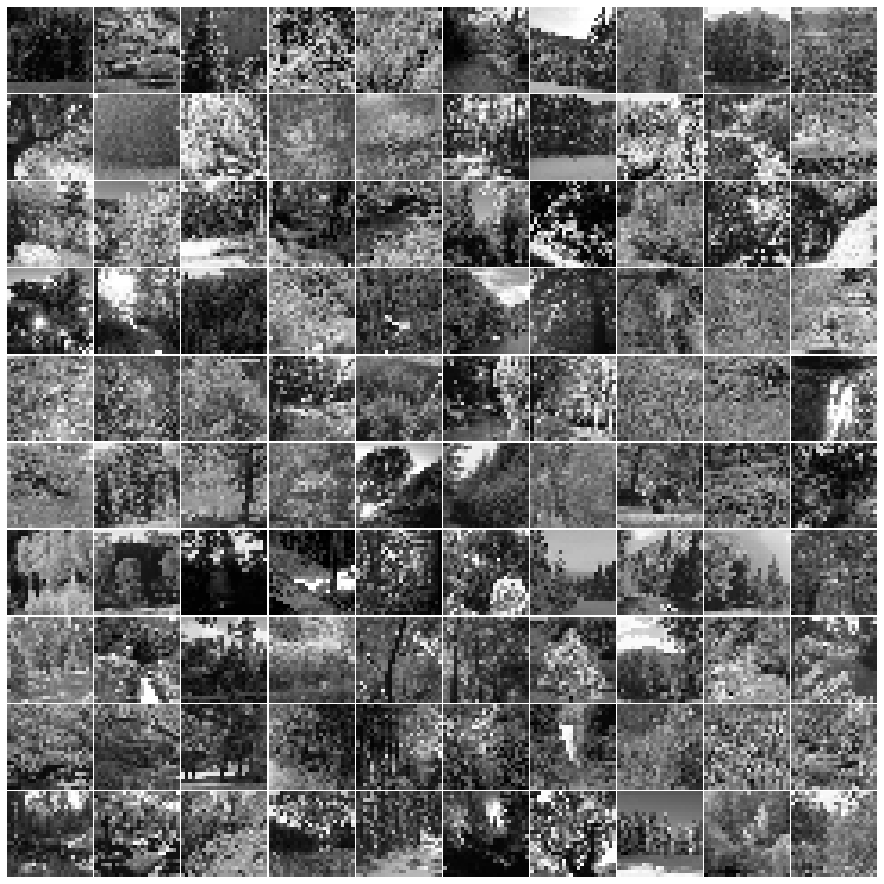

In [152]:
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(16., 16.))
grid = ImageGrid(
    fig,
    111,  # similar to subplot(111)
    nrows_ncols=(10, 10),  # creates 2x2 grid of axes
    # axes_pad=0.1,  # pad between axes in inch.
)

fNames = os.listdir('../hw2_data/p1/train/Forest/')
for ax, fName in zip(grid, fNames):
    path = '../hw2_data/p1/train/Forest/' + fName
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    resized = cv2.resize(img, (24, 24))
    ax.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
    ax.axis('off')

In [153]:
fig.savefig('Forest.png', bbox_inches='tight')

In [1]:
import os
import glob
import cv2
import matplotlib.pyplot as plt
import numpy as np
from cyvlfeat.sift.dsift import dsift
import pickle
import cv2
import numpy as np
from scipy.spatial import distance
import pickle
import scipy.spatial.distance as distance
from cyvlfeat.sift.dsift import dsift

with open('vocab.pkl', 'rb') as f:
    vocab = pickle.load(f)

vocab_size = vocab.shape[0]

In [110]:
x = range(400)
data = {}
fNames = os.listdir('../hw2_data/p1/train/Forest/')
for fName in fNames:
    path = '../hw2_data/p1/train/Forest/' + fName
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    kp, descriptors = dsift(img, step=(5, 5), fast=True, float_descriptors=True)
    
    descriptor_count = descriptors.shape[0]
    dist = distance.cdist(descriptors, vocab)
    argmin = dist.argmin(axis=1)

    histogram = np.bincount(argmin, minlength=vocab_size).astype(np.float32)
    histogram /= descriptor_count  # normalize histogram


    data[path] = [kp, descriptors, argmin, histogram]

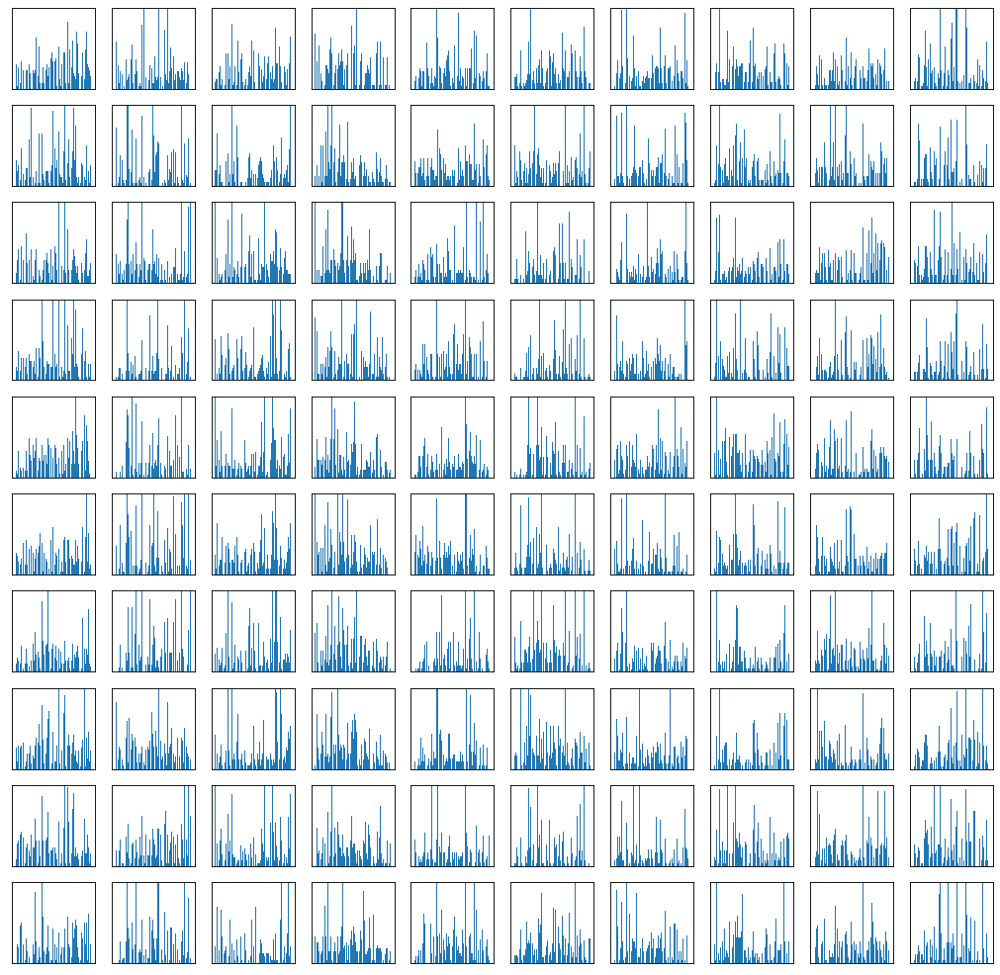

In [3]:
# plt.figure(figsize=(16, 16), dpi=80)
# plt.tight_layout()
# maxY = max(np.percentile(d[-1], 95) for d in data.values())

# for i, v in enumerate(data.values(), 1):
#     ax = plt.subplot(10, 10, i)
#     ax.bar(x, v[-1])    
    
#     ax.get_xaxis().set_ticks([])
#     ax.get_yaxis().set_ticks([])
#     ax.set_ylim((0, maxY))

# plt.show()

In [4]:
len(data.values())

100

In [14]:
avg = np.zeros_like(next(iter(data.values()))[-1])

for d in data.values():
    avg += d[-1]

avg /= 100

<BarContainer object of 400 artists>

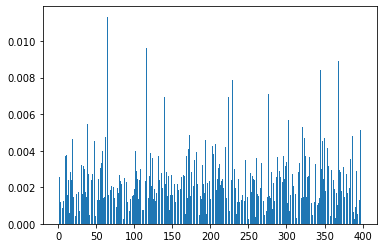

In [10]:
plt.bar(x, avg)

In [123]:
largestIdx = np.argsort(avg)[-4:]
keys = set(largestIdx)
keys

{271, 344, 364, 389}

In [146]:
x = range(400)
data = {}
fNames = os.listdir('../hw2_data/p1/train/Forest/')

img = cv2.imread('../hw2_data/p1/train/Forest/' + fNames[0], cv2.IMREAD_UNCHANGED)
kp, descriptors = dsift(img, step=(5, 5), fast=True, float_descriptors=True)
descriptor_count = descriptors.shape[0]
dist = distance.cdist(descriptors, vocab)
argmin = dist.argmin(axis=1)

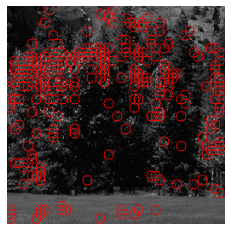

In [148]:
out = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

for coord, idx in zip(kp, argmin):
    if idx in keys:
        cv2.circle(out, tuple(coord)[::-1], 6, (255, 0, 0), 1)
        # print(coord)

plt.axis('off')
plt.imshow(out)
plt.savefig('forest0.png', bbox_inches='tight')

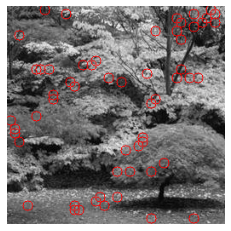

In [149]:
img = cv2.imread('../hw2_data/p1/train/Forest/' + fNames[1], cv2.IMREAD_UNCHANGED)
kp, descriptors = dsift(img, step=(5, 5), fast=True, float_descriptors=True)
descriptor_count = descriptors.shape[0]
dist = distance.cdist(descriptors, vocab)
argmin = dist.argmin(axis=1)

out = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

for coord, idx in zip(kp, argmin):
    if idx in keys:
        cv2.circle(out, tuple(coord)[::-1], 6, (255, 0, 0), 1)
        # print(coord)

plt.axis('off')
plt.imshow(out)
plt.savefig('forest1.png', bbox_inches='tight')

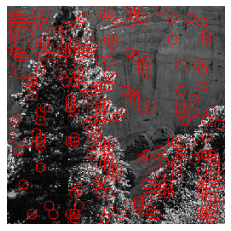

In [150]:
img = cv2.imread('../hw2_data/p1/train/Forest/' + fNames[2], cv2.IMREAD_UNCHANGED)
kp, descriptors = dsift(img, step=(5, 5), fast=True, float_descriptors=True)
descriptor_count = descriptors.shape[0]
dist = distance.cdist(descriptors, vocab)
argmin = dist.argmin(axis=1)

out = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

for coord, idx in zip(kp, argmin):
    if idx in keys:
        cv2.circle(out, tuple(coord)[::-1], 6, (255, 0, 0), 1)
        # print(coord)

plt.axis('off')
plt.imshow(out)
plt.savefig('forest2.png', bbox_inches='tight')

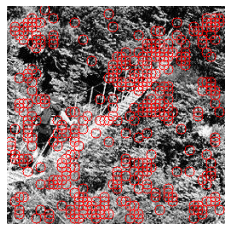

In [136]:
img = cv2.imread('../hw2_data/p1/train/Forest/' + fNames[3], cv2.IMREAD_UNCHANGED)
kp, descriptors = dsift(img, step=(5, 5), fast=True, float_descriptors=True)
descriptor_count = descriptors.shape[0]
dist = distance.cdist(descriptors, vocab)
argmin = dist.argmin(axis=1)

out = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

for coord, idx in zip(kp, argmin):
    if idx in keys:
        cv2.circle(out, tuple(coord)[::-1], 6, (255, 0, 0), 1)
        # print(coord)

plt.axis('off')
plt.imshow(out)

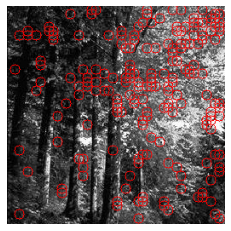

In [151]:
img = cv2.imread('../hw2_data/p1/train/Forest/' + fNames[84], cv2.IMREAD_UNCHANGED)
kp, descriptors = dsift(img, step=(5, 5), fast=True, float_descriptors=True)
descriptor_count = descriptors.shape[0]
dist = distance.cdist(descriptors, vocab)
argmin = dist.argmin(axis=1)
histogram = np.bincount(argmin, minlength=vocab_size).astype(np.float32)
histogram /= descriptor_count  # normalize histogram

out = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

for coord, idx in zip(kp, argmin):
    if idx in keys:
        cv2.circle(out, tuple(coord)[::-1], 6, (255, 0, 0), 1)
        # print(coord)

plt.axis('off')
plt.imshow(out)
plt.savefig('forest84.png', bbox_inches='tight')

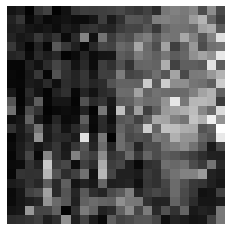

In [159]:
fNames = os.listdir('../hw2_data/p1/train/Forest/')
path = '../hw2_data/p1/train/Forest/' + fNames[84]
img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
resized = cv2.resize(img, (24, 24))
plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.savefig('forest84_tiny.png', bbox_inches='tight')

In [63]:
with open("train_image_feats.pkl", "rb") as handle:
    train_image_feats = pickle.load(handle)
with open("test_image_feats.pkl", "rb") as handle:
    test_image_feats = pickle.load(handle)


def get_image_paths(data_path, categories, num_train_per_cat):
    num_categories = len(categories)

    train_image_paths = []
    test_image_paths = []

    train_labels = []
    test_labels = []

    for category in categories:

        image_paths = glob.glob(os.path.join(data_path, "train", category, "*.jpg"))
        for i in range(num_train_per_cat):
            train_image_paths.append(image_paths[i])
            train_labels.append(category)

        image_paths = glob.glob(os.path.join(data_path, "test", category, "*.jpg"))
        for i in range(num_train_per_cat):
            test_image_paths.append(image_paths[i])
            test_labels.append(category)

    return train_image_paths, test_image_paths, train_labels, test_labels


In [64]:
CATEGORIES = [
    "Kitchen",
    "Store",
    "Bedroom",
    "LivingRoom",
    "Office",
    "Industrial",
    "Suburb",
    "InsideCity",
    "TallBuilding",
    "Street",
    "Highway",
    "OpenCountry",
    "Coast",
    "Mountain",
    "Forest",
]

train_image_paths, test_image_paths, train_labels, test_labels = get_image_paths(
    "../hw2_data/p1/", CATEGORIES, 100
)

In [67]:
k = 10
N = train_image_feats.shape[0]
dist = distance.cdist(test_image_feats, train_image_feats, metric="cityblock")
ind = dist.argpartition(kth=k)[..., :k]

In [68]:
nei = [
    np.bincount(ind_row, weights=(1 / (dist[i, ind_row] + 1e-12))).argmax() for i, ind_row in enumerate(ind)
]

In [76]:
import collections
ans = collections.defaultdict(collections.Counter)
for index, (i, true_labels) in enumerate(zip(nei, test_labels)):
    if train_labels[i] == true_labels:
        for j in ind[index]:
            if train_labels[j] == true_labels:
                ans[true_labels][j] += 1
ans['Forest']

Counter({477: 10,
         406: 28,
         481: 36,
         451: 18,
         465: 3,
         494: 14,
         428: 20,
         409: 34,
         449: 16,
         434: 19,
         450: 10,
         459: 5,
         440: 6,
         483: 10,
         452: 32,
         404: 19,
         443: 47,
         456: 7,
         417: 5,
         485: 4,
         472: 13,
         491: 5,
         468: 19,
         430: 10,
         462: 4,
         457: 4,
         471: 26,
         489: 9,
         495: 16,
         460: 6,
         455: 5,
         476: 12,
         496: 26,
         407: 2,
         479: 15,
         416: 3,
         470: 20,
         444: 30,
         439: 9,
         469: 3,
         405: 9,
         473: 10,
         408: 5,
         475: 27,
         490: 17,
         436: 3,
         413: 4,
         497: 2,
         431: 2,
         438: 10,
         466: 9,
         445: 3,
         498: 9,
         474: 11,
         401: 3,
         448: 7,
         478: 2,
  

In [108]:
import heapq

h = [(freq, i) for i,freq in ans['Forest'].items()]
keys = set([i for _, i in heapq.nlargest(5, h)])
keys

{1400, 1434, 1442, 1490, 1496}

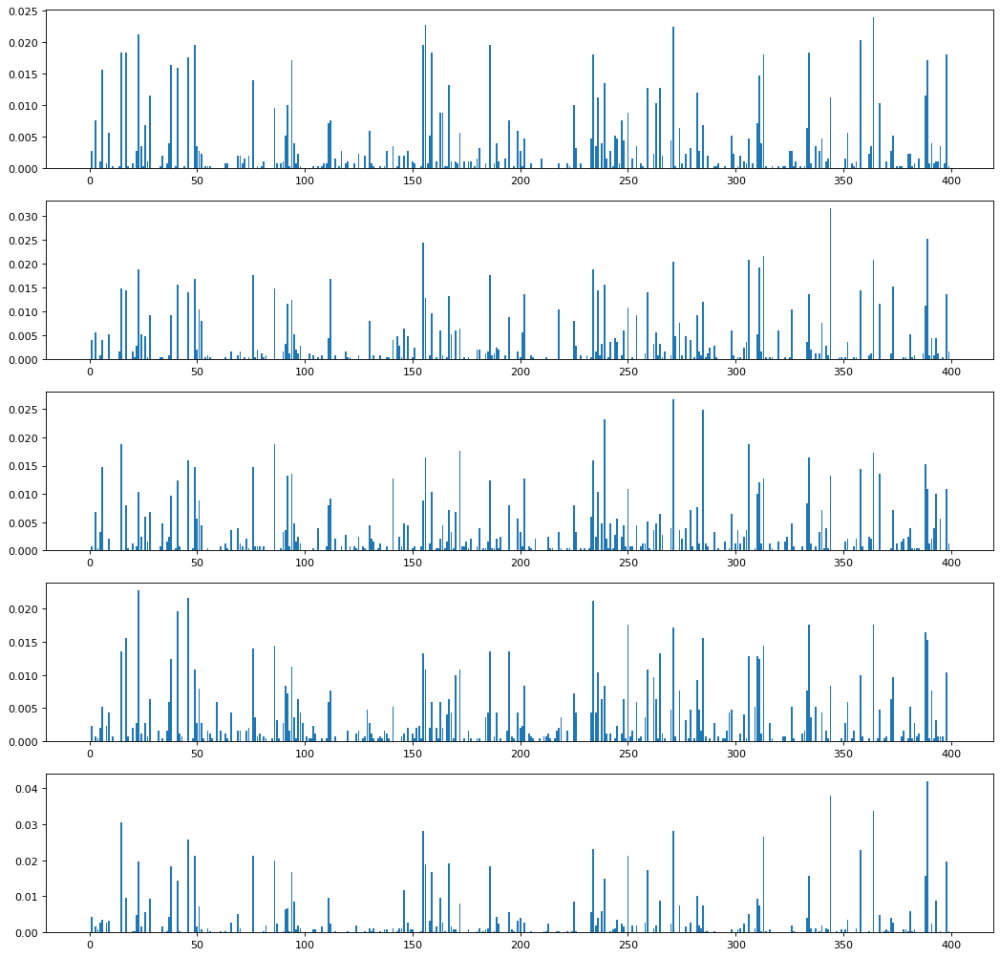

In [111]:
plt.figure(figsize=(16, 16), dpi=80)
plt.tight_layout()

for i, k in enumerate(keys, 1):
    v = data[train_image_paths[k]][-1].copy()

    ax = plt.subplot(len(keys), 1, i)
    ax.bar(x, v)
    
    # ax.get_xaxis().set_ticks([])
    # ax.get_yaxis().set_ticks([])
    # ax.set_ylim((0, maxY))

plt.show()

In [116]:
avg = np.zeros_like(data[train_image_paths[list(keys)[0]]][-1].copy())

for k in keys:
    avg += data[train_image_paths[k]][-1].copy()

avg /= len(keys)

<BarContainer object of 400 artists>

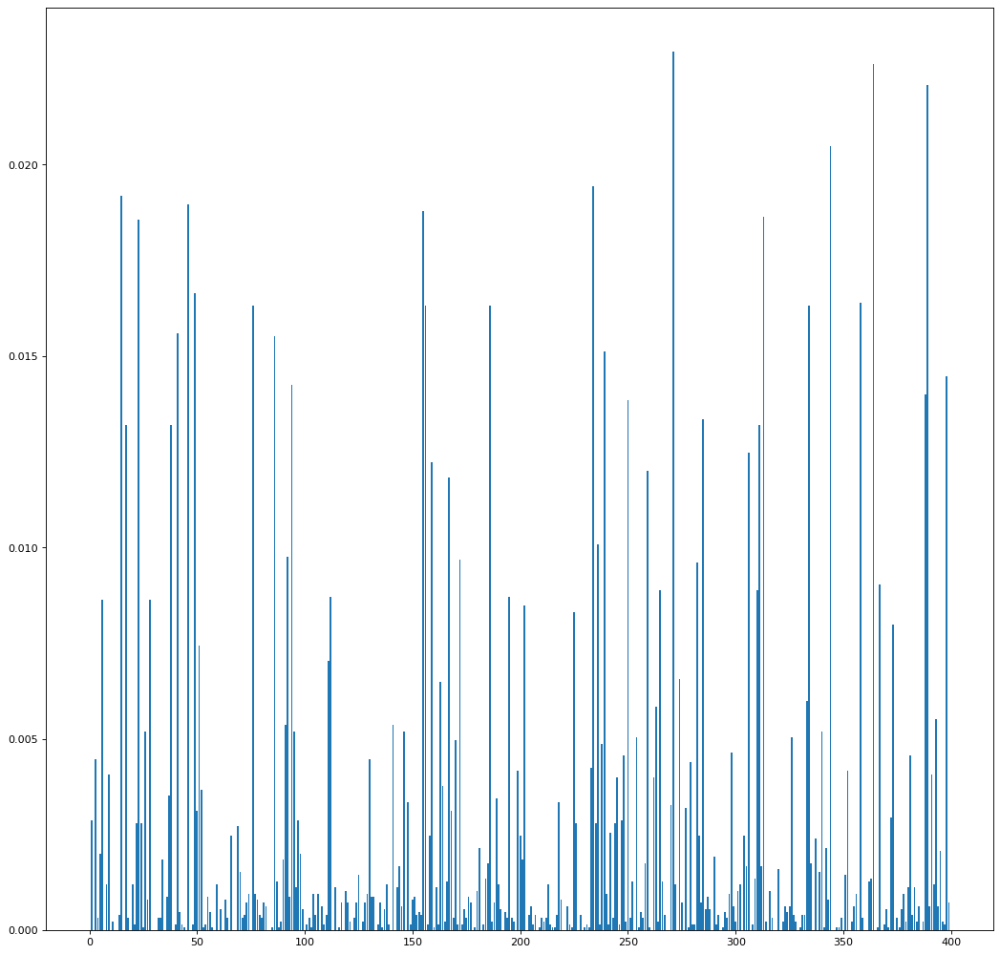

In [117]:
plt.figure(figsize=(16, 16), dpi=80)
plt.tight_layout()
plt.bar(x, avg)

In [ ]:
np.argsort(avg)